# Books Recommender System

![](http://labs.criteo.com/wp-content/uploads/2017/08/CustomersWhoBought3.jpg)

This is the second part of my project on Book Data Analysis and Recommendation Systems. 

In my first notebook ([The Story of Book](https://www.kaggle.com/omarzaghlol/goodreads-1-the-story-of-book/)), I attempted at narrating the story of book by performing an extensive exploratory data analysis on Books Metadata collected from Goodreads.

In this notebook, I will attempt at implementing a few recommendation algorithms (Basic Recommender, Content-based and Collaborative Filtering) and try to build an ensemble of these models to come up with our final recommendation system.

# What's in this kernel?

- [Importing Libraries and Loading Our Data](#1)
- [Clean the dataset](#2)
- [Simple Recommender](#3)
    - [Top Books](#4)
    - [Top "Genres" Books](#5)
- [Content Based Recommender](#6)
    - [Cosine Similarity](#7)
    - [Popularity and Ratings](#8)
- [Collaborative Filtering](#9)
    - [User Based](#10)
    - [Item Based](#11)
- [Hybrid Recommender](#12)
- [Conclusion](#13)
- [Save Model](#14)

# Importing Libraries and Loading Our Data <a id="1"></a> <br>

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
######
from lenskit import batch, topn
import lenskit.crossfold as xf
import warnings
warnings.filterwarnings('ignore')
# !pip install lenskit_tf
from lenskit import topn, util
from lenskit.algorithms import Recommender, item_knn, user_knn as knn, als, tf
from lenskit.algorithms import basic


In [8]:
books = pd.read_csv('goodbook/books.csv')
ratings = pd.read_csv('goodbook/ratings.csv')
book_tags = pd.read_csv('goodbook/book_tags.csv')
tags = pd.read_csv('goodbook/tags.csv')

# Start with Book tags

In [9]:
genres = ["Art", "Biography", "Business", "Chick Lit", "Children's", "Christian", "Classics",
          "Comics", "Contemporary", "Cookbooks", "Crime", "Ebooks", "Fantasy", "Fiction",
          "Gay and Lesbian", "Graphic Novels", "Historical Fiction", "History", "Horror",
          "Humor and Comedy", "Manga", "Memoir", "Music", "Mystery", "Nonfiction", "Paranormal",
          "Philosophy", "Poetry", "Psychology", "Religion", "Romance", "Science", "Science Fiction", 
          "Self Help", "Suspense", "Spirituality", "Sports", "Thriller", "Travel", "Young Adult"]

genres = list(map(str.lower, genres))
genres[:4]


['art', 'biography', 'business', 'chick lit']

In [10]:
available_genres = tags.loc[tags.tag_name.str.lower().isin(genres)]


In [11]:
available_genres_books = book_tags[book_tags.tag_id.isin(available_genres.tag_id)]
print('There are {} books that are tagged with above genres'.format(available_genres_books.shape[0]))


There are 60573 books that are tagged with above genres


In [59]:
# 250 in 35min
((950 * 35)/250) #/ 60

133.0

In [12]:
available_genres_books['genre'] = available_genres.tag_name.loc[available_genres_books.tag_id].values
available_genres_books.head()

,goodreads_book_id,tag_id,count,genre
1,1,11305,37174,fantasy
5,1,11743,9954,fiction
25,1,7457,958,classics
38,1,22973,673,paranormal
52,1,20939,465,mystery


In [14]:
available_genres_books.to_csv ("/Users/mslokom/Documents/RecSys_News/goodbook/available_genres_books.csv", index= False)

In [442]:
np.sort(ratings.groupby('user_id')['rating'].count())[::-1]

array([200, 200, 199, ...,   2,   2,   2])

In [443]:
dup_ratings = ratings.drop_duplicates(keep='first')
dup_ratings

,book_id,user_id,rating
0,1,314,5
1,1,439,3
2,1,588,5
3,1,1169,4
4,1,1185,4
...,...,...,...
981751,10000,48386,5
981752,10000,49007,4
981753,10000,49383,5
981754,10000,50124,5


In [444]:
print (len (dup_ratings.user_id.unique()))
print(len (dup_ratings.book_id.unique()))

53424
10000


In [445]:
available_genres_books = book_tags[book_tags.tag_id.isin(available_genres.tag_id)]
available_genres_books ["book_id"] = available_genres_books ["goodreads_book_id"]
available_genres_books['genre'] = available_genres.tag_name.loc[available_genres_books.tag_id].values

# Merge the DataFrames based on the 'book_id' column
genres_ratings = dup_ratings.merge(available_genres_books, on='book_id', how='inner')
genres_ratings

,book_id,user_id,rating,goodreads_book_id,tag_id,count,genre
0,1,314,5,1,11305,37174,fantasy
1,1,314,5,1,11743,9954,fiction
2,1,314,5,1,7457,958,classics
3,1,314,5,1,22973,673,paranormal
4,1,314,5,1,20939,465,mystery
...,...,...,...,...,...,...,...
496543,9998,53249,5,9998,14821,21,horror
496544,9998,53249,5,9998,8055,18,contemporary
496545,9998,53249,5,9998,23471,17,philosophy
496546,9998,53249,5,9998,10210,7,ebooks


In [446]:
df_fil = genres_ratings[['user_id', 'book_id', 'rating', 'genre']]
df_fil

,user_id,book_id,rating,genre
0,314,1,5,fantasy
1,314,1,5,fiction
2,314,1,5,classics
3,314,1,5,paranormal
4,314,1,5,mystery
...,...,...,...,...
496543,53249,9998,5,horror
496544,53249,9998,5,contemporary
496545,53249,9998,5,philosophy
496546,53249,9998,5,ebooks


In [447]:
ratings_sorted = df_fil.sort_values(by='user_id')
ratings_sorted

,user_id,book_id,rating,genre
484516,2,9762,4,philosophy
484513,2,9762,4,psychology
484514,2,9762,4,spirituality
484517,2,9762,4,religion
484515,2,9762,4,nonfiction
...,...,...,...,...
201189,53424,4214,5,classics
201188,53424,4214,5,fantasy
201195,53424,4214,5,ebooks
201196,53424,4214,5,travel


In [448]:
# genres_ratings_sorted= ratings_sorted.rename(columns={'user_index': 'user', 'book_index': 'book_id'})
# genres_ratings_sorted

In [449]:
grouped_df = ratings_sorted.groupby(['user_id', 'book_id']).agg({'genre': ', '.join, 'rating': 'mean'}).reset_index()
grouped_df

,user_id,book_id,genre,rating
0,2,9762,"philosophy, psychology, spirituality, religion...",4.0
1,3,9014,"thriller, fantasy, fiction, horror, ebooks, sc...",1.0
2,4,3273,"ebooks, travel, contemporary, fiction, history...",2.0
3,7,1519,"fantasy, philosophy, history, poetry, fiction,...",5.0
4,7,3711,"religion, classics, contemporary, fiction",5.0
...,...,...,...,...
79526,53420,4625,"ebooks, classics, fiction",3.0
79527,53420,6538,"nonfiction, history, suspense, ebooks, science...",4.0
79528,53422,7667,"suspense, mystery, thriller, fiction, crime, s...",4.0
79529,53423,4984,"classics, fiction, biography, ebooks, science,...",5.0


In [450]:
# Step 1: Filter book_ids with less than 10 ratings
book_counts = grouped_df['book_id'].value_counts()
popular_books = book_counts[book_counts >= 3].index
df_filtered_books = grouped_df[grouped_df['book_id'].isin(popular_books)]

# Step 2: Filter users with less than 20 interactions
user_counts = df_filtered_books['user_id'].value_counts()
active_users = user_counts[user_counts >= 10].index
df_filtered = df_filtered_books[df_filtered_books['user_id'].isin(active_users)]

# Step 3: Reset the indices of the filtered DataFrame
df_filtered.reset_index(drop=True, inplace=True)

# Now, df_filtered contains the data where book_ids have at least 10 ratings, users have at least 20 interactions, and the indices are reset.

# Step 4: Create mapping dictionaries for book_id and user_id to integer indices
book_id_to_index = {book_id: index+1 for index, book_id in enumerate(df_filtered['book_id'].unique())}
user_id_to_index = {user_id: index+1 for index, user_id in enumerate(df_filtered['user_id'].unique())}

# Step 5: Map book_id and user_id to integer indices in the DataFrame
df_filtered['book_index'] = df_filtered['book_id'].map(book_id_to_index)
df_filtered['user_index'] = df_filtered['user_id'].map(user_id_to_index)

# Now, df_filtered contains integer indices for book_id and user_id in the 'book_index' and 'user_index' columns.
# df_filtered = df_filtered.rename(columns={'user_index': 'user', 'book_index': 'item'})


In [451]:
# df_filtered.to_csv ("goodbook/V1_RealIDS_ratings_filtered_goodbook.csv", index= False)

In [452]:
df_filtered

,user_id,book_id,genre,rating,book_index,user_index
0,173,6,"classics, fiction, fantasy, contemporary, myst...",5.0,1,1
1,173,34,"fiction, classics, fantasy, ebooks",1.0,2,1
2,173,106,"classics, science, fiction, fantasy, philosoph...",2.0,3,1
3,173,112,"science, ebooks, religion, philosophy, classic...",5.0,4,1
4,173,249,"ebooks, fiction, classics, contemporary, roman...",4.0,5,1
...,...,...,...,...,...,...
13187,53293,1624,"memoir, classics, nonfiction, travel, history,...",5.0,90,943
13188,53293,3388,"music, fiction, classics, ebooks, history, con...",5.0,19,943
13189,53293,3581,"classics, ebooks, thriller, mystery, fiction, ...",5.0,109,943
13190,53293,3590,"mystery, fiction, crime, ebooks, thriller, sus...",5.0,110,943


In [453]:
grouped_df = df_filtered[['user_index', 'book_index', 'rating', 'genre']]
grouped_df.head (50)

,user_index,book_index,rating,genre
0,1,1,5.0,"classics, fiction, fantasy, contemporary, myst..."
1,1,2,1.0,"fiction, classics, fantasy, ebooks"
2,1,3,2.0,"classics, science, fiction, fantasy, philosoph..."
3,1,4,5.0,"science, ebooks, religion, philosophy, classic..."
4,1,5,4.0,"ebooks, fiction, classics, contemporary, roman..."
5,1,6,4.0,"ebooks, romance, biography, fiction, contempor..."
6,1,7,4.0,"religion, ebooks, spirituality, romance, philo..."
7,1,8,5.0,"romance, contemporary, fiction, classics"
8,1,9,3.0,"fiction, contemporary, classics, crime, scienc..."
9,1,10,2.0,"religion, fantasy, history, art, romance, eboo..."


In [455]:
# grouped_df= df_filtered.copy()
# Number of unique user_ids and book_ids
num_unique_users = grouped_df['user_index'].nunique()
num_unique_books = grouped_df['book_index'].nunique()

# Total possible interactions (assuming all combinations exist)
total_possible_interactions = num_unique_users * num_unique_books

# Actual number of interactions (non-zero ratings)
num_interactions = grouped_df.shape[0]

# Sparsity calculation
sparsity = 1.0 - (num_interactions / total_possible_interactions)

# Print the results
print(f"Number of unique user_ids: {num_unique_users}")
print(f"Number of unique book_ids: {num_unique_books}")
print(f"Sparsity of the data: {sparsity:.4f}")

Number of unique user_ids: 943
Number of unique book_ids: 761
Sparsity of the data: 0.9816


In [456]:
# Group by 'user_id' and count the ratings for each user
user_ratings_counts = grouped_df.groupby('user')['rating'].count()

# Sort the user ratings counts in descending order
sorted_user_ratings_counts = np.sort(user_ratings_counts)[::-1]

# If you want to sort in descending order but preserve the corresponding user IDs:
sorted_user_ids = user_ratings_counts.index[np.argsort(user_ratings_counts.values)[::-1]]

# If you want to see both user IDs and their corresponding counts:
sorted_user_data = pd.DataFrame({'user': sorted_user_ids, 'rating_count': sorted_user_ratings_counts})
sorted_user_data

KeyError: 'user'

# Train / Test Split

In [26]:


# user_sampling = xf.SampleN(5)

# folds = list(xf.partition_users(grouped_df, 1, xf.SampleN(5)))
# train, test = next(folds)

for i, tp in enumerate(xf.partition_users(grouped_df, 1, xf.SampleN(5))):
  tp.train.to_csv('train-book%d.csv' % (i,), index= False)
  tp.test.to_csv('val-book%d.csv' % (i,), index= False)

In [30]:
grouped_df.to_csv ("goodbook/ratings_filtered_goodbook.csv", index= False)

In [28]:
train = pd.read_csv("goodbook/trainVal-book0.csv")
for i, tp in enumerate(xf.partition_users(grouped_df, 1, xf.SampleN(5))):
  tp.train.to_csv('train-book%d.csv' % (i,), index= False)
  tp.test.to_csv('val-book%d.csv' % (i,), index= False)

In [ ]:
grouped_df.to_csv("goodbook/processed_GB_Data.csv", index=False)


# Recommendation

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
######
from lenskit import batch, topn
import lenskit.crossfold as xf
import warnings
warnings.filterwarnings('ignore')
# !pip install lenskit_tf
from lenskit import topn, util
from lenskit.algorithms import Recommender, als, tf
from lenskit.algorithms import basic


In [153]:
p_obfuscation = 0.01
preprocess = ["1Step", "2Step", "original"][1]
mode = ["strategic", "random"][0]
topk = [5, 10][0] #
round = [1, 2, 3][1]
# train = pd.read_csv ("goodbook/trainVal-book0.csv", sep=",", names= ["user", "item", "rating", "genre"]) # 
# train = pd.read_csv (f"goodbook/Random/Adding_user_item_matrix_{p_obfuscation}_top50Inditems_top100IndiUsers_Categories.csv", sep=",", names= ["user", "item"])#, "rating", "genre"]) # 
train = pd.read_csv (f"goodbook/Random/obfuscated_user_item_matrix_{p_obfuscation}_{mode}_top50Inditems_top100IndiUsers_Categories.csv", sep=",", names= ["user", "item"])#, "rating", "genre"]) # 
# val = pd.read_csv ("goodbook/val-book0.csv", sep=",", names= ["user", "item", "rating", "genre"])
test = pd.read_csv ("goodbook/test-book0.csv", sep=",", names= ["user", "item", "rating", "genre"])
topk

5

In [154]:
train

,user,item
0,user_id,item_id
1,1,3
2,1,4
3,1,5
4,1,7
...,...,...
7890,943,88
7891,943,90
7892,943,109
7893,943,127


In [155]:
# grouped_df= df_filtered.copy()
# Number of unique user_ids and book_ids
num_unique_users = train['user'].nunique()
num_unique_books = train['item'].nunique()

# Total possible interactions (assuming all combinations exist)
total_possible_interactions = num_unique_users * num_unique_books

# Actual number of interactions (non-zero ratings)
num_interactions = train.shape[0]

# Sparsity calculation
sparsity = 1.0 - (num_interactions / total_possible_interactions)

# Print the results
print(f"Number of unique user_ids: {num_unique_users}")
print(f"Number of unique book_ids: {num_unique_books}")
print(f"Sparsity of the data: {sparsity:.4f}")
print(f"lentgh of the data: ", len (train))

Number of unique user_ids: 944
Number of unique book_ids: 705
Sparsity of the data: 0.9881
lentgh of the data:  7895


In [156]:
train ["rating"] = 1
train = train [["user", "item", "rating"]] #.copy ()
# trainVal_small.to_csv ("goodbook/trainVal_small.csv", index= False)\

# val_small = train [["user", "item", "rating"]] #.copy ()
# train_small.to_csv ("goodbook/train_small.csv", index= False)
test ["rating"] = 1
test = test [["user", "item", "rating"]] #.copy ()
# test_small.to_csv ("goodbook/test_small.csv", index= False)


In [157]:
train

,user,item,rating
0,user_id,item_id,1
1,1,3,1
2,1,4,1
3,1,5,1
4,1,7,1
...,...,...,...
7890,943,88,1
7891,943,90,1
7892,943,109,1
7893,943,127,1


In [158]:
from lenskit.algorithms import item_knn, user_knn

BPR = tf.BPR(features=200, epochs= 200)
algo_ii = item_knn.ItemItem(20, feedback='implicit', use_ratings= 'False') # center= 'False', 
algo_uu = user_knn.UserUser (50, feedback='implicit', use_ratings= 'False') # center= 'False', 
algo_als = als.ImplicitMF(features= 50)
pop = basic.Popular()
def evaluation(aname, algo, train, test):
    fittable = util.clone(algo)
    fittable = Recommender.adapt(fittable)
    fittable.fit(train)
    users = test.user.unique()
    # now we run the recommender
    recs = batch.recommend(fittable, users, topk)
    # add the algorithm name for analyzability
    recs['Algorithm'] = aname
    return recs

In [159]:
all_recs = []
test_data = []
# for train, test in xf.partition_users(ratings[['user', 'item', 'rating']], 5, xf.SampleFrac(0.2)):
test_data.append(test)

In [160]:
all_recs.append(evaluation('ItemKNN', algo_ii, train, test))
all_recs.append(evaluation('UserKNN', algo_uu, train, test))
all_recs.append(evaluation('BPR', BPR, train, test))
all_recs.append(evaluation('implicitMF', algo_als, train, test))
all_recs.append(evaluation('pop', pop, train, test))

all_recs = pd.concat(all_recs, ignore_index=True)


user 1 has no ratings and none provided
user 5 has no ratings and none provided
user 6 has no ratings and none provided
user 7 has no ratings and none provided
user 3 has no ratings and none provided
user 9 has no ratings and none provided
user 11 has no ratings and none provided
user 14 has no ratings and none provided
user 8 has no ratings and none provided
user 10 has no ratings and none provided
user 12 has no ratings and none provided
user 15 has no ratings and none provided
user 17 has no ratings and none provided
user 18 has no ratings and none provided
user 2 has no ratings and none provided
user 13 has no ratings and none provided
user 16 has no ratings and none provided
user 19 has no ratings and none provided
user 21 has no ratings and none provided
user 22 has no ratings and none provided
user 23 has no ratings and none provided
user 20 has no ratings and none provided
user 24 has no ratings and none provided
user 26 has no ratings and none provided
user 30 has no ratings a

Epoch 1/200
1/1 [==============================] - 0s 178ms/step - loss: 0.7136
Epoch 2/200
1/1 [==============================] - 0s 15ms/step - loss: 0.7125
Epoch 3/200
1/1 [==============================] - 0s 14ms/step - loss: 0.7104
Epoch 4/200
1/1 [==============================] - 0s 15ms/step - loss: 0.7091
Epoch 5/200
1/1 [==============================] - 0s 14ms/step - loss: 0.7075
Epoch 6/200
1/1 [==============================] - 0s 14ms/step - loss: 0.7062
Epoch 7/200
1/1 [==============================] - 0s 14ms/step - loss: 0.7040
Epoch 8/200
1/1 [==============================] - 0s 14ms/step - loss: 0.7026
Epoch 9/200
1/1 [==============================] - 0s 15ms/step - loss: 0.7009
Epoch 10/200
1/1 [==============================] - 0s 14ms/step - loss: 0.6994
Epoch 11/200
1/1 [==============================] - 0s 14ms/step - loss: 0.6980
Epoch 12/200
1/1 [==============================] - 0s 15ms/step - loss: 0.6965
Epoch 13/200
1/1 [==============================

In [161]:
all_recs_df = all_recs.copy ()

# # all_recs_df.to_csv ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS_1%-Add.csv", index= False)
file_path = f"/Users/mslokom/Documents/RecSys_News/goodbook/results/Random/RS-{topk}_{p_obfuscation}_{preprocess}_{round}.csv"
all_recs_df.to_csv(file_path, index=False)

In [162]:
test_data = []
test_data.append(test)
test_data = pd.concat(test_data, ignore_index=True)

In [163]:
rla = topn.RecListAnalysis()
rla.add_metric(topn.ndcg)
rla.add_metric(topn.hit)
rla.add_metric(topn.precision)
rla.add_metric(topn.recall)
rla.add_metric(topn.recip_rank)

results = rla.compute(all_recs, test_data) # all_recs
results.head()

ValueError: You are trying to merge on object and int64 columns. If you wish to proceed you should use pd.concat

In [ ]:
results.groupby('Algorithm').mean()

,nrecs,ndcg,hit,precision,recall,recip_rank
Algorithm,,,,,,
BPR,5.0,0.167127,0.530223,0.152916,0.152916,0.342948
ItemKNN,5.0,0.166767,0.516437,0.151856,0.151856,0.340509
UserKNN,5.0,0.135103,0.435843,0.121951,0.121951,0.280877
implicitMF,5.0,0.158564,0.498409,0.145493,0.145493,0.318735
pop,5.0,0.018097,0.100742,0.021209,0.021209,0.031654


In [ ]:
# results.to_csv ("/Users/mslokom/Documents/RecSys_News/goodbook/results/results_RecSys_1%-Add.csv") # 2%_top50Inditems_top100IndiUsers_Categories
file_path = f"/Users/mslokom/Documents/RecSys_News/goodbook/results/Random/results_RecSys-{topk}_{p_obfuscation}_{preprocess}_{round}.csv"
results.to_csv(file_path, index=False)

In [ ]:
aggres = results.groupby('Algorithm').mean()
file_path = f"/Users/mslokom/Documents/RecSys_News/goodbook/results/Random/aggres_RecSys-{topk}_{p_obfuscation}_{preprocess}_{round}.csv"
aggres.to_csv(file_path, index=False)

In [ ]:
# res = pd.read_csv ("/Users/mslokom/Documents/RecSys_News/goodbook/results_BPR_2%_top50Inditems_top100IndiUsers_Categories.csv")
# res

In [ ]:
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Assuming you have a DataFrame called 'results'
# # 'results' should contain columns: User, nDCG, Hit, Precision, Recall

# # Create subplots
# fig, axes = plt.subplots(2, 2, figsize=(12, 8))
# fig.suptitle("Distribution of Users per Evaluation Metric on *Manipulated Data (2%)*")

# # Define colors for each metric
# colors = ["blue", "green", "orange", "red"]

# # Plot nDCG distribution
# sns.histplot(data=res, x="ndcg", kde=False, ax=axes[0, 0], color=colors[0])
# axes[0, 0].set_title("nDCG Distribution")

# # Plot Hit distribution
# sns.histplot(data=res, x="hit", kde=False, ax=axes[0, 1], color=colors[1])
# axes[0, 1].set_title("Hit Distribution")

# # Plot Precision distribution
# sns.histplot(data=res, x="precision", kde=False, ax=axes[1, 0], color=colors[2])
# axes[1, 0].set_title("Precision Distribution")

# # Plot Recall distribution
# sns.histplot(data=res, x="recall", kde=False, ax=axes[1, 1], color=colors[3])
# axes[1, 1].set_title("Recall Distribution")
# # Add counts to the bars
# for ax in axes.flat:
#     for bar in ax.containers[0]:
#         ax.annotate(int(bar.get_height()), (bar.get_x() + bar.get_width() / 2, bar.get_height()),
#                     ha='center', va='bottom')

# # Display the plots
# plt.tight_layout()
# plt.subplots_adjust(top=0.9)
# plt.show()



In [178]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
from lenskit import batch, topn
import lenskit.crossfold as xf
import warnings
from lenskit import topn, util
from lenskit.algorithms import Recommender, als, tf, item_knn, user_knn, basic

warnings.filterwarnings('ignore')

# Constants
p_obfuscation = 0.1
preprocess = "2Step"
mode = "random"

# Data Loading
train = pd.read_csv(f"goodbook/Random/Adding_user_item_matrix_{p_obfuscation}_top50Inditems_top100IndiUsers_Categories_{mode}.csv", sep=",", names=["user", "item"])
test = pd.read_csv("goodbook/test-book0.csv", sep=",", names=["user", "item", "rating", "genre"])
# {mode}_ : only for removal outputs
# Sparsity Calculation
num_unique_users = train['user'].nunique()
num_unique_books = train['item'].nunique()
total_possible_interactions = num_unique_users * num_unique_books
num_interactions = train.shape[0]
sparsity = 1.0 - (num_interactions / total_possible_interactions)

print(f"Number of unique user_ids: {num_unique_users}")
print(f"Number of unique book_ids: {num_unique_books}")
print(f"Sparsity of the data: {sparsity:.4f}")
print(f"Length of the data: {len(train)}")

# Preparing Data
train["rating"] = 1
train = train[["user", "item", "rating"]]
test["rating"] = 1
test = test[["user", "item", "rating"]]

# Algorithms
BPR = tf.BPR(features=200, epochs=200)
algo_ii = item_knn.ItemItem(20, feedback='implicit', use_ratings=False)
algo_uu = user_knn.UserUser(50, feedback='implicit', use_ratings=False)
algo_als = als.ImplicitMF(features=50)
pop = basic.Popular()

def evaluation(aname, algo, train, test, topk):
    fittable = util.clone(algo)
    fittable = Recommender.adapt(fittable)
    fittable.fit(train)
    users = test.user.unique()
    recs = batch.recommend(fittable, users, topk)
    recs['Algorithm'] = aname
    return recs

def run_evaluation(round, topk, train, test):
    all_recs = []
    all_recs.append(evaluation('ItemKNN', algo_ii, train, test, topk))
    all_recs.append(evaluation('UserKNN', algo_uu, train, test, topk))
    all_recs.append(evaluation('BPR', BPR, train, test, topk))
    all_recs.append(evaluation('implicitMF', algo_als, train, test, topk))
    all_recs.append(evaluation('pop', pop, train, test, topk))

    all_recs_df = pd.concat(all_recs, ignore_index=True)
    file_path = f"/Users/mslokom/Documents/RecSys_News/goodbook/results/Random/RS-{topk}_{p_obfuscation}_{preprocess}_{round}.csv"
    all_recs_df.to_csv(file_path, index=False)

    rla = topn.RecListAnalysis()
    rla.add_metric(topn.ndcg)
    rla.add_metric(topn.hit)
    rla.add_metric(topn.precision)
    rla.add_metric(topn.recall)
    rla.add_metric(topn.recip_rank)

    results = rla.compute(all_recs_df, test)
    results_file_path = f"/Users/mslokom/Documents/RecSys_News/goodbook/results/Random/results_RecSys-{topk}_{p_obfuscation}_{preprocess}_{round}.csv"
    results.to_csv(results_file_path, index=False)

    aggres = results.groupby('Algorithm').mean()
    aggres_file_path = f"/Users/mslokom/Documents/RecSys_News/goodbook/results/Random/aggres_RecSys-{topk}_{p_obfuscation}_{preprocess}_{round}.csv"
    aggres.to_csv(aggres_file_path, index=False)

for round in range(1, 4):
    for topk in [5, 10]:
        run_evaluation(round, topk, train, test)


Number of unique user_ids: 943
Number of unique book_ids: 721
Sparsity of the data: 0.9861
Length of the data: 9446
Epoch 1/200
1/1 [==============================] - 0s 237ms/step - loss: 0.7137
Epoch 2/200
1/1 [==============================] - 0s 16ms/step - loss: 0.7126
Epoch 3/200
1/1 [==============================] - 0s 17ms/step - loss: 0.7109
Epoch 4/200
1/1 [==============================] - 0s 20ms/step - loss: 0.7092
Epoch 5/200
1/1 [==============================] - 0s 21ms/step - loss: 0.7077
Epoch 6/200
1/1 [==============================] - 0s 24ms/step - loss: 0.7063
Epoch 7/200
1/1 [==============================] - 0s 90ms/step - loss: 0.7047
Epoch 8/200
1/1 [==============================] - 0s 33ms/step - loss: 0.7035
Epoch 9/200
1/1 [==============================] - 0s 21ms/step - loss: 0.7019
Epoch 10/200
1/1 [==============================] - 0s 23ms/step - loss: 0.7004
Epoch 11/200
1/1 [==============================] - 0s 25ms/step - loss: 0.6990
Epoch 12/200

## Average the recommendation performance

In [5]:
import pandas as pd

# Constants
p_obfuscations = [0.01, 0.02, 0.05, 0.1]
preprocess = "2Step"
mode = "random"

# Define the rounds and top-k values you want to average over
rounds = [1, 2, 3]
topks = [5, 10]

# Initialize an empty list to hold DataFrames
all_dfs = []

# Read the CSV files for each p_obfuscation, round, and top-k
for p_obfuscation in p_obfuscations:
    for round in rounds:
        for topk in topks:
            file_path = f"/Users/mslokom/Documents/RecSys_News/goodbook/results/Greedy/2Step/aggres_RecSys-{topk}_{p_obfuscation}_{preprocess}_{round}.csv"
            df = pd.read_csv(file_path)
            df['p_obfuscation'] = p_obfuscation
            df['Round'] = round
            df['TopK'] = topk
            all_dfs.append(df)

# Concatenate all DataFrames into a single DataFrame
combined_df = pd.concat(all_dfs, ignore_index=True)

# Group by Algorithm, TopK, and p_obfuscation to calculate mean and std for each metric
metrics = ['ndcg', 'hit', 'precision', 'recall', 'recip_rank']
agg_results = combined_df.groupby(['Algorithm', 'TopK', 'p_obfuscation'])[metrics].agg(['mean', 'std']).reset_index()
agg_results
# Save the results to a new CSV file
# output_file = f"/Users/mslokom/Documents/RecSys_News/goodbook/results/Random/aggres_summary_RecSys_{preprocess}.csv"
# agg_results.to_csv(output_file, index=False)

# print(f"Aggregated results saved to {output_file}")


KeyError: 'Algorithm'

# Evaluation Fair-nDCG

In [ ]:
df_book = pd.read_csv ("/Users/mslokom/Documents/RecSys_News/goodbook/processed_GB_Data.csv", sep=",", names= ["user", "item", "genre"])
df_book

FileNotFoundError: [Errno 2] No such file or directory: 'bla//Users/mslokom/Documents/RecSys_News/goodbook/processed_GB_Data.csv'

In [ ]:
# df_book = df_book[['item']].drop_duplicates()
unique_items_genres = df_book.reset_index(drop=True).drop_duplicates(subset=['item', 'genre'], keep='last')
unique_items_genres = unique_items_genres [['item', 'genre']]
unique_items_genres = unique_items_genres.reset_index(drop=True).drop_duplicates(subset=['item'], keep='last')


In [ ]:
df_books = unique_items_genres.copy ()#.head (50)

In [ ]:
ground_truth_F = pd.read_csv ("goodbook/test-book0.csv", sep=",", names= ["user", "item", "rating", "genre"])


In [ ]:
# predictions_file_paths = [
#     ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.0_Original.csv", "data_1"),
#     ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.01_Add.csv", "data_2"),
#     ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.02_Add.csv", "data_3"),
#     ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.05_Add.csv", "data_4"),
#     ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.1_Add.csv", "data_5"),
#     ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.5_Add.csv", "data_6"),
# ]

# # Create a dictionary to store DataFrames
# datasets = {}

# # Read the news DataFrame (assuming df_news is defined)
# data_0 = ground_truth_F # df_news

# # Iterate over prediction files
# for file_path, dataset_name in predictions_file_paths:
#     # Read the prediction file
#     df = pd.read_csv(file_path)

#     # Store the DataFrame in the dictionary
#     datasets[dataset_name] = df


In [ ]:
# # for dataset_name, dataset_df in datasets.items():
# #     # Merge the dataset with df_book on the "item" column
# #     merged_df = pd.merge(dataset_df, df_book[['item', 'genre']], on='item', how='left')

# #     datasets[dataset_name] = merged_df
# # data_1 = datasets['data_1']
# # data_2 = datasets['data_2']
# # data_3 = datasets['data_3']
# # data_4 = datasets['data_4']
# # data_5 = datasets['data_5']
# # data_6 = datasets['data_6']
# # data_6
# predictions_file_paths = [
#     ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.0_Original.csv", "data_1"),
#     ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.01_Add.csv", "data_2"),
#     ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.02_Add.csv", "data_3"),
#     ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.05_Add.csv", "data_4"),
#     ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.1_Add.csv", "data_5"),
#     ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.5_Add.csv", "data_6"),
# ]

# # Create a dictionary to store DataFrames
# datasets = {}

# # Read the news DataFrame (assuming df_news is defined)
# data_0 = ground_truth_F # df_news

# # Iterate over prediction files
# for file_path, dataset_name in predictions_file_paths:
#     # Read the prediction file
#     df = pd.read_csv(file_path)

#     # Store the DataFrame in the dictionary
#     datasets[dataset_name] = df

# algorithm_to_focus = 'BPR'

# for dataset_name, dataset_df in datasets.items():
#     # Filter the dataset to include only rows where the Algorithm is 'BPR'
#     filtered_df = dataset_df[dataset_df['Algorithm'] == algorithm_to_focus]

#     # Merge the filtered dataset with df_book on the "item" column
#     merged_df = pd.merge(filtered_df, df_book[['item', 'genre']], on='item', how='left')

#     # Update the dataset in the datasets dictionary
#     datasets[dataset_name] = merged_df

# # Now, you have individual datasets for each dataset_name containing only the 'BPR' algorithm data
# data_1 = datasets['data_1']
# data_2 = datasets['data_2']
# data_3 = datasets['data_3']
# data_4 = datasets['data_4']
# data_5 = datasets['data_5']
# data_6 = datasets['data_6']
# data_6

In [ ]:
predictions_file_paths = [
    ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.0_Original.csv", "data_1"),
    ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.01_Add.csv", "data_2"),
    ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.02_Add.csv", "data_3"),
    ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.05_Add.csv", "data_4"),
    ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.1_Add.csv", "data_5"),
    ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.5_Add.csv", "data_6"),
]

# Create a dictionary to store DataFrames
datasets = {}

# Read the news DataFrame (assuming df_news is defined)
data_0 = ground_truth_F # df_news

# Iterate over prediction files
for file_path, dataset_name in predictions_file_paths:
    # Read the prediction file
    df = pd.read_csv(file_path)

    # Store the DataFrame in the dictionary
    datasets[dataset_name] = df

algorithm_to_focus = ['BPR', 'implicitMF', 'pop'][2]

for dataset_name, dataset_df in datasets.items():
    # Filter the dataset to include only rows where the Algorithm is 'BPR'
    filtered_df = dataset_df[dataset_df['Algorithm'] == algorithm_to_focus]

    # Merge the filtered dataset with df_book on the "item" column
    merged_df = pd.merge(filtered_df, df_books[['item', 'genre']], on='item', how='left')

    # Drop duplicates based on 'user', 'item', and 'Algorithm'
    merged_df = merged_df.drop_duplicates(subset=['user', 'item', 'Algorithm'])

    # Update the dataset in the datasets dictionary
    datasets[dataset_name] = merged_df

# Now, you have individual datasets for each dataset_name containing only the 'BPR' algorithm data
data_1 = datasets['data_1']
data_2 = datasets['data_2']
data_3 = datasets['data_3']
data_4 = datasets['data_4']
data_5 = datasets['data_5']
data_6 = datasets['data_6']
data_6


,item,score,user,rank,Algorithm,genre
0,60,104.0,1,1,pop,"thriller, crime, mystery, fiction, contemporar..."
1,61,99.0,1,2,pop,"history, psychology, ebooks, philosophy, busin..."
2,25,98.0,1,3,pop,"philosophy, ebooks, religion, fiction, fantasy..."
3,58,98.0,1,4,pop,"fiction, romance"
4,68,98.0,1,5,pop,"science, classics, fiction, mystery, ebooks, p..."
...,...,...,...,...,...,...
94295,11,45.0,943,96,pop,"memoir, history, biography, nonfiction, fictio..."
94296,79,45.0,943,97,pop,"fiction, fantasy, history, science, philosophy..."
94297,148,45.0,943,98,pop,"history, travel, contemporary, classics, memoi..."
94298,206,45.0,943,99,pop,"contemporary, business, ebooks, fiction"


In [ ]:
predictions_F_org = data_1
predictions_F_1perc = data_2
predictions_F_2perc = data_3
predictions_F_5perc = data_4
predictions_F_10perc= data_5
predictions_F_50perc= data_6


In [ ]:

ground_truth_F['rank'] = ground_truth_F.groupby('user').cumcount() + 1
ground_truth_F

,user,item,rating,genre,rank
0,1,2,1.0,"fiction, classics, fantasy, ebooks",1
1,1,9,3.0,"fiction, contemporary, classics, crime, scienc...",2
2,1,6,4.0,"ebooks, romance, biography, fiction, contempor...",3
3,1,12,5.0,"ebooks, fiction, romance, contemporary",4
4,1,1,5.0,"classics, fiction, fantasy, contemporary, myst...",5
...,...,...,...,...,...
4710,943,85,5.0,"fiction, contemporary, history, classics, crim...",1
4711,943,132,5.0,"fantasy, classics, contemporary, fiction, mystery",2
4712,943,110,5.0,"mystery, fiction, crime, ebooks, thriller, sus...",3
4713,943,50,5.0,"crime, comics, fiction, mystery, contemporary,...",4


In [ ]:
predictions_F_10perc

,item,score,user,rank,Algorithm,genre
0,123,87.0,1,1,pop,"poetry, classics, fiction, ebooks, romance, fa..."
1,23,84.0,1,2,pop,"classics, ebooks, fiction"
2,60,83.0,1,3,pop,"thriller, crime, mystery, fiction, contemporar..."
3,25,82.0,1,4,pop,"philosophy, ebooks, religion, fiction, fantasy..."
4,22,81.0,1,5,pop,"ebooks, classics, contemporary, history, fiction"
...,...,...,...,...,...,...
94295,319,28.0,943,96,pop,"memoir, sports, fiction, nonfiction, history, ..."
94296,202,27.0,943,97,pop,"poetry, religion, history, fantasy, classics"
94297,339,27.0,943,98,pop,"classics, poetry, fiction"
94298,371,26.0,943,99,pop,"classics, memoir, history, ebooks, travel, non..."


In [ ]:

def fair_dcg(predictions, k, relevant_categories):
    data = list(zip(predictions['rank'], predictions['genre']))

    sorted_data = sorted(data, key=lambda x: x[0])

    fair_dcg_score = 0.0
    total_weight = 0.0
    unique_categories = set()

    for i, (rank, genres) in enumerate(sorted_data, 1):
        if i > k:
            break  # Stop calculating after reaching the top k

        # Split the string into a list of genres
        genre_list = [genre.strip() for genre in genres.split(',')]

        # Convert the list of genres to a set
        genre_set = set(genre_list)

        print(genre_set)  # Print the genre set for debugging

        # Check if any relevant category is present in the genre set
        gain = 2 ** 1 - 1 if any(category in genre_set for category in relevant_categories) else 2 ** 0 - 1
        print (gain)
        discount = np.log2(i + 1)

        # Update total weight only if a relevant category is present
        if gain == 1:
            total_weight += 1.0

        # Update unique categories
        unique_categories.update(genre_set)
        print (unique_categories)
        fair_dcg_score += (gain / discount)

    # Normalize by the ideal DCG
    ideal_labels = [1] + [0] * (k - 1)  # Ideal ranking for binary relevance
    ideal_dcg = sum((2 ** label - 1) / np.log2(i + 1) for i, label in enumerate(ideal_labels, 1) if i <= k)
    fair_dcg_score /= ideal_dcg

    # Avoid division by zero
    if total_weight != 0:
        # Normalize by the total weight
        fair_dcg_score /= len(unique_categories) / total_weight
    else:
        fair_dcg_score = 0.0

    return fair_dcg_score

#  'crime', 'memoir', 'religion', 'suspense', 'art', 'music', 'manga', 'cookbooks', 'psychology', 'travel', 'business', 'paranormal', 
relevant_categories = ['music', 'poetry', 'horror', 'spirituality', 'sports', 'christian', 'comics', 'manga', 'cookbooks', 'psychology', 'art']

datasets = [ground_truth_F, predictions_F_org, predictions_F_1perc, predictions_F_2perc, predictions_F_5perc, predictions_F_10perc, predictions_F_50perc]
dataset_names = ['Ground Truth', 'Predictions Org', 'Predictions 1%', 'Predictions 2%', 'Predictions 5%', 'Predictions 10%', 'Predictions 50%']

results = []

for i, dataset in enumerate(datasets):
    print (i, dataset)
    for k in range(1, 101):  # Adjust the range based on your needs
        print (k)
        score = fair_dcg(dataset, k, relevant_categories)
        results.append({'Dataset': dataset_names[i], 'k': k, 'fair_ndcg_score': score})

# Create a DataFrame from the results
results_df = pd.DataFrame(results)
results_df
# Save the DataFrame to a CSV file
# results_df.to_csv(f'/Users/mslokom/Documents/RecSys_News/goodbook/results/fair_ndcg_results-{algorithm_to_focus}.csv', index=False)


0       user  item  rating                                              genre  \
0        1     2     1.0                 fiction, classics, fantasy, ebooks   
1        1     9     3.0  fiction, contemporary, classics, crime, scienc...   
2        1     6     4.0  ebooks, romance, biography, fiction, contempor...   
3        1    12     5.0             ebooks, fiction, romance, contemporary   
4        1     1     5.0  classics, fiction, fantasy, contemporary, myst...   
...    ...   ...     ...                                                ...   
4710   943    85     5.0  fiction, contemporary, history, classics, crim...   
4711   943   132     5.0  fantasy, classics, contemporary, fiction, mystery   
4712   943   110     5.0  mystery, fiction, crime, ebooks, thriller, sus...   
4713   943    50     5.0  crime, comics, fiction, mystery, contemporary,...   
4714   943    70     5.0  fiction, contemporary, travel, nonfiction, mem...   

      rank  
0        1  
1        2  
2        3

,Dataset,k,fair_ndcg_score
0,Ground Truth,1,0.000000
1,Ground Truth,2,0.000000
2,Ground Truth,3,0.000000
3,Ground Truth,4,0.000000
4,Ground Truth,5,0.022756
...,...,...,...
695,Predictions 50%,96,0.528862
696,Predictions 50%,97,0.528862
697,Predictions 50%,98,0.528862
698,Predictions 50%,99,0.528862


In [ ]:
algorithm_to_focus = "pop"
results_df= pd.read_csv(f'/Users/mslokom/Documents/RecSys_News/goodbook/results/fair_ndcg_results-{algorithm_to_focus}-1-step.csv', index=False)
results_df

TypeError: read_csv() got an unexpected keyword argument 'index'

In [ ]:

results_df_norm = results_df.copy () #pd.read_csv ("/Users/mslokom/Documents/RecSys_News/jobs_server/NRMS/nrms_results/fair_ndcg_results-nrms_2step.csv")
results_df_norm ["normalized"] = results_df_norm ["fair_ndcg_score"] / max (results_df_norm ["fair_ndcg_score"])#.max()
results_df_norm#.to_csv (f"/Users/mslokom/Documents/RecSys_News/goodbook/results/fair_ndcg_df-{algorithm_to_focus}-1-step.csv", index= False) 

,Dataset,k,fair_ndcg_score,normalized
0,Ground Truth,1,0.000000,0.000000
1,Ground Truth,2,0.000000,0.000000
2,Ground Truth,3,0.000000,0.000000
3,Ground Truth,4,0.000000,0.000000
4,Ground Truth,5,0.022756,0.000137
...,...,...,...,...
695,Predictions 50%,96,0.528862,0.003180
696,Predictions 50%,97,0.528862,0.003180
697,Predictions 50%,98,0.528862,0.003180
698,Predictions 50%,99,0.528862,0.003180


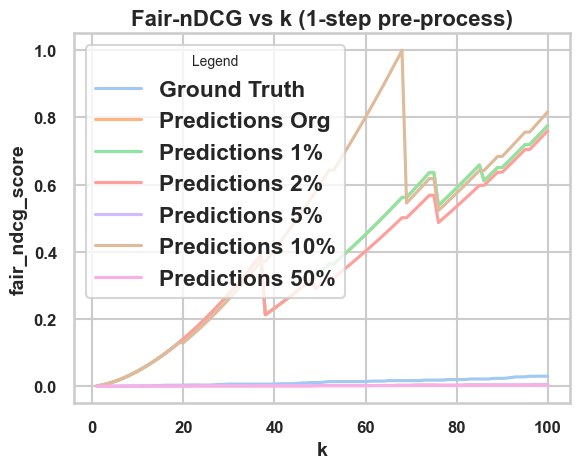

In [ ]:
import seaborn as sns  # Import seaborn for color palettes

# Set the seaborn style and context for better aesthetics
sns.set(style="whitegrid")
sns.set_context("talk")

# Plot line plots for each dataset with a different color palette
datasets = results_df_norm['Dataset'].unique()

# Choose a color palette from seaborn, e.g., "pastel"
colors = sns.color_palette("pastel", len(datasets))

for i, dataset in enumerate(datasets):
    dataset_df = results_df_norm[results_df_norm['Dataset'] == dataset]
    plt.plot(dataset_df['k'], dataset_df['normalized'], label=dataset, color=colors[i])

# Set labels and title with increased text size and bold text
plt.xlabel('k', fontsize=14, fontweight='bold')
plt.ylabel('fair_ndcg_score', fontsize=14, fontweight='bold')
plt.title('Fair-nDCG vs k (1-step pre-process)', fontsize=16, fontweight='bold')

# Increase the size of tick labels and bolden them
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Add legend with increased text size and bold text
plt.legend(fontsize=10, title='Legend', title_fontsize=10, prop={'weight': 'bold'})

# Save the plot to a PDF file
# pdf_filename = f'/Users/mslokom/Documents/RecSys_News/goodbook/results/figures/fair_ndcg_plot-{algorithm_to_focus}-1-step.pdf'
# plt.savefig(pdf_filename, bbox_inches='tight')

# Show the plot
plt.show()


## 2-step

In [ ]:
predictions_file_paths = [
    ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.0_Original.csv", "data_1"),
    ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.01_Obf.csv", "data_2"),
    ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.02_Obf.csv", "data_3"),
    ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.05_Obf.csv", "data_4"),
    ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.1_Obf.csv", "data_5"),
    ("/Users/mslokom/Documents/RecSys_News/goodbook/results/RS-100_0.5_Obf.csv", "data_6"),
]

# Create a dictionary to store DataFrames
datasets = {}

# Read the news DataFrame (assuming df_news is defined)
data_0 = ground_truth_F # df_news

# Iterate over prediction files
for file_path, dataset_name in predictions_file_paths:
    # Read the prediction file
    df = pd.read_csv(file_path)

    # Store the DataFrame in the dictionary
    datasets[dataset_name] = df

algorithm_to_focus = ['BPR', 'implicitMF', 'pop'][2]

for dataset_name, dataset_df in datasets.items():
    # Filter the dataset to include only rows where the Algorithm is 'BPR'
    filtered_df = dataset_df[dataset_df['Algorithm'] == algorithm_to_focus]

    # Merge the filtered dataset with df_book on the "item" column
    merged_df = pd.merge(filtered_df, df_books[['item', 'genre']], on='item', how='left')

    # Drop duplicates based on 'user', 'item', and 'Algorithm'
    merged_df = merged_df.drop_duplicates(subset=['user', 'item', 'Algorithm'])

    # Update the dataset in the datasets dictionary
    datasets[dataset_name] = merged_df

# Now, you have individual datasets for each dataset_name containing only the 'BPR' algorithm data
data_1 = datasets['data_1']
data_2 = datasets['data_2']
data_3 = datasets['data_3']
data_4 = datasets['data_4']
data_5 = datasets['data_5']
data_6 = datasets['data_6']
data_6


,item,score,user,rank,Algorithm,genre
0,283,76.0,1,1,pop,"contemporary, classics, mystery, ebooks, thril..."
1,288,52.0,1,2,pop,"science, nonfiction, history, ebooks, cookbooks"
2,327,47.0,1,3,pop,"history, fiction, classics"
3,205,46.0,1,4,pop,"ebooks, paranormal, contemporary, fiction, fan..."
4,300,46.0,1,5,pop,"fiction, contemporary, fantasy, history, class..."
...,...,...,...,...,...,...
94295,530,31.0,943,96,pop,"ebooks, poetry, fiction, fantasy, classics"
94296,551,31.0,943,97,pop,"horror, ebooks, suspense, thriller, fiction, c..."
94297,603,31.0,943,98,pop,"ebooks, religion, mystery, thriller, fiction, ..."
94298,619,31.0,943,99,pop,"fantasy, manga, romance, paranormal, comics, c..."


In [ ]:
predictions_F_org = data_1
predictions_F_1perc = data_2
predictions_F_2perc = data_3
predictions_F_5perc = data_4
predictions_F_10perc= data_5
predictions_F_50perc= data_6

ground_truth_F['rank'] = ground_truth_F.groupby('user').cumcount() + 1
ground_truth_F

,user,item,rating,genre,rank
0,1,2,1.0,"fiction, classics, fantasy, ebooks",1
1,1,9,3.0,"fiction, contemporary, classics, crime, scienc...",2
2,1,6,4.0,"ebooks, romance, biography, fiction, contempor...",3
3,1,12,5.0,"ebooks, fiction, romance, contemporary",4
4,1,1,5.0,"classics, fiction, fantasy, contemporary, myst...",5
...,...,...,...,...,...
4710,943,85,5.0,"fiction, contemporary, history, classics, crim...",1
4711,943,132,5.0,"fantasy, classics, contemporary, fiction, mystery",2
4712,943,110,5.0,"mystery, fiction, crime, ebooks, thriller, sus...",3
4713,943,50,5.0,"crime, comics, fiction, mystery, contemporary,...",4


In [ ]:
#  'crime', 'memoir', 'religion', 'suspense', 'art', 'music', 'manga', 'cookbooks', 'psychology', 'travel', 'business', 'paranormal', 
relevant_categories = ['music', 'poetry', 'horror', 'spirituality', 'sports', 'christian', 'comics', 'manga', 'cookbooks', 'psychology', 'art']

datasets = [ground_truth_F, predictions_F_org, predictions_F_1perc, predictions_F_2perc, predictions_F_5perc, predictions_F_10perc, predictions_F_50perc]
dataset_names = ['Ground Truth', 'Predictions Org', 'Predictions 1%', 'Predictions 2%', 'Predictions 5%', 'Predictions 10%', 'Predictions 50%']

results = []

for i, dataset in enumerate(datasets):
    print (i, dataset)
    for k in range(1, 101):  # Adjust the range based on your needs
        print (k)
        score = fair_dcg(dataset, k, relevant_categories)
        results.append({'Dataset': dataset_names[i], 'k': k, 'fair_ndcg_score': score})

# Create a DataFrame from the results
results_df = pd.DataFrame(results)
# Save the DataFrame to a CSV file
results_df.to_csv(f'/Users/mslokom/Documents/RecSys_News/goodbook/results/fair_ndcg_results-{algorithm_to_focus}-2-step.csv', index=False)


0       user  item  rating                                              genre  \
0        1     2     1.0                 fiction, classics, fantasy, ebooks   
1        1     9     3.0  fiction, contemporary, classics, crime, scienc...   
2        1     6     4.0  ebooks, romance, biography, fiction, contempor...   
3        1    12     5.0             ebooks, fiction, romance, contemporary   
4        1     1     5.0  classics, fiction, fantasy, contemporary, myst...   
...    ...   ...     ...                                                ...   
4710   943    85     5.0  fiction, contemporary, history, classics, crim...   
4711   943   132     5.0  fantasy, classics, contemporary, fiction, mystery   
4712   943   110     5.0  mystery, fiction, crime, ebooks, thriller, sus...   
4713   943    50     5.0  crime, comics, fiction, mystery, contemporary,...   
4714   943    70     5.0  fiction, contemporary, travel, nonfiction, mem...   

      rank  
0        1  
1        2  
2        3

In [ ]:
results_df_norm = results_df.copy () #pd.read_csv ("/Users/mslokom/Documents/RecSys_News/jobs_server/NRMS/nrms_results/fair_ndcg_results-nrms_2step.csv")
results_df_norm ["normalized"] = results_df_norm ["fair_ndcg_score"] / max (results_df_norm ["fair_ndcg_score"])#.max()
results_df_norm.to_csv (f"/Users/mslokom/Documents/RecSys_News/goodbook/results/fair_ndcg_df-{algorithm_to_focus}-2-step.csv", index= False) 

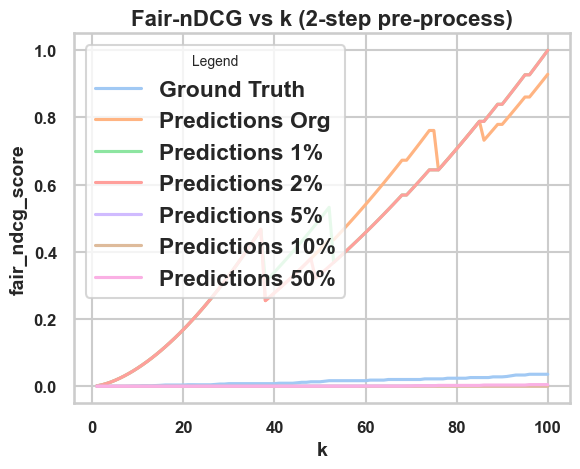

In [ ]:
import seaborn as sns  # Import seaborn for color palettes

# Set the seaborn style and context for better aesthetics
sns.set(style="whitegrid")
sns.set_context("talk")

# Plot line plots for each dataset with a different color palette
datasets = results_df_norm['Dataset'].unique()

# Choose a color palette from seaborn, e.g., "pastel"
colors = sns.color_palette("pastel", len(datasets))

for i, dataset in enumerate(datasets):
    dataset_df = results_df_norm[results_df_norm['Dataset'] == dataset]
    plt.plot(dataset_df['k'], dataset_df['normalized'], label=dataset, color=colors[i])

# Set labels and title with increased text size and bold text
plt.xlabel('k', fontsize=14, fontweight='bold')
plt.ylabel('fair_ndcg_score', fontsize=14, fontweight='bold')
plt.title('Fair-nDCG vs k (2-step pre-process)', fontsize=16, fontweight='bold')

# Increase the size of tick labels and bolden them
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Add legend with increased text size and bold text
plt.legend(fontsize=10, title='Legend', title_fontsize=10, prop={'weight': 'bold'})

# Save the plot to a PDF file
pdf_filename = f'/Users/mslokom/Documents/RecSys_News/goodbook/results/figures/fair_ndcg_plot-{algorithm_to_focus}-2-step.pdf'
plt.savefig(pdf_filename, bbox_inches='tight')

# Show the plot
plt.show()


# Clean the dataset <a id="2"></a> <br>

As with nearly any real-life dataset, we need to do some cleaning first. When exploring the data I noticed that for some combinations of user and book there are multiple ratings, while in theory there should only be one (unless users can rate a book several times). Furthermore, for the collaborative filtering it is better to have more ratings per user. So I decided to remove users who have rated fewer than 3 books.

In [ ]:
# books['original_publication_year'] = books['original_publication_year'].fillna(-1).apply(lambda x: int(x) if x != -1 else -1)

In [ ]:
# ratings_rmv_duplicates = ratings.drop_duplicates()
# unwanted_users = ratings_rmv_duplicates.groupby('user_id')['user_id'].count()
# unwanted_users = unwanted_users[unwanted_users < 3]
# unwanted_ratings = ratings_rmv_duplicates[ratings_rmv_duplicates.user_id.isin(unwanted_users.index)]
# new_ratings = ratings_rmv_duplicates.drop(unwanted_ratings.index)

In [ ]:
# new_ratings['title'] = books.set_index('id').title.loc[new_ratings.book_id].values

In [ ]:
# new_ratings.head(10)

# Simple Recommender <a id="3"></a> <br>

The Simple Recommender offers generalized recommnendations to every user based on book popularity and (sometimes) genre. The basic idea behind this recommender is that books that are more popular and more critically acclaimed will have a higher probability of being liked by the average audience. This model does not give personalized recommendations based on the user.

The implementation of this model is extremely trivial. All we have to do is sort our books based on ratings and popularity and display the top books of our list. As an added step, we can pass in a genre argument to get the top books of a particular genre.


I will use IMDB's *weighted rating* formula to construct my chart. Mathematically, it is represented as follows:

Weighted Rating (WR) = $(\frac{v}{v + m} . R) + (\frac{m}{v + m} . C)$

where,
* *v* is the number of ratings for the book
* *m* is the minimum ratings required to be listed in the chart
* *R* is the average rating of the book
* *C* is the mean rating across the whole report

The next step is to determine an appropriate value for *m*, the minimum ratings required to be listed in the chart. We will use **95th percentile** as our cutoff. In other words, for a book to feature in the charts, it must have more ratings than at least 95% of the books in the list.

I will build our overall Top 250 Chart and will define a function to build charts for a particular genre. Let's begin!

In [ ]:
# v = books['ratings_count']
# m = books['ratings_count'].quantile(0.95)
# R = books['average_rating']
# C = books['average_rating'].mean()
# W = (R*v + C*m) / (v + m)

In [ ]:
# books['weighted_rating'] = W

In [ ]:
# qualified  = books.sort_values('weighted_rating', ascending=False).head(250)

## Top Books <a id="4"></a> <br>

In [ ]:
# qualified[['title', 'authors', 'average_rating', 'weighted_rating']].head(15)

We see that J.K. Rowling's **Harry Potter** Books occur at the very top of our chart. The chart also indicates a strong bias of Goodreads Users towards particular genres and authors. 

Let us now construct our function that builds charts for particular genres. For this, we will use relax our default conditions to the **85th** percentile instead of 95. 

## Top "Genres" Books <a id="5"></a> <br>

In [ ]:
# book_tags.head()

In [ ]:
# tags.head()

In [ ]:
# genres = ["Art", "Biography", "Business", "Chick Lit", "Children's", "Christian", "Classics",
#           "Comics", "Contemporary", "Cookbooks", "Crime", "Ebooks", "Fantasy", "Fiction",
#           "Gay and Lesbian", "Graphic Novels", "Historical Fiction", "History", "Horror",
#           "Humor and Comedy", "Manga", "Memoir", "Music", "Mystery", "Nonfiction", "Paranormal",
#           "Philosophy", "Poetry", "Psychology", "Religion", "Romance", "Science", "Science Fiction", 
#           "Self Help", "Suspense", "Spirituality", "Sports", "Thriller", "Travel", "Young Adult"]

          

In [ ]:
# genres = list(map(str.lower, genres))
# genres[:4]

In [ ]:
# available_genres = tags.loc[tags.tag_name.str.lower().isin(genres)]

In [ ]:
# available_genres.head()

In [ ]:
# available_genres_books = book_tags[book_tags.tag_id.isin(available_genres.tag_id)]

In [ ]:
# print('There are {} books that are tagged with above genres'.format(available_genres_books.shape[0]))

In [ ]:
# available_genres_books.head()

In [ ]:
# len (available_genres_books.goodreads_book_id.unique())

In [ ]:
# available_genres_books['genre'] = available_genres.tag_name.loc[available_genres_books.tag_id].values
# available_genres_books.head()

In [ ]:
# def build_chart(genre, percentile=0.85):
#     df = available_genres_books[available_genres_books['genre'] == genre.lower()]
#     qualified = books.set_index('book_id').loc[df.goodreads_book_id]

#     v = qualified['ratings_count']
#     m = qualified['ratings_count'].quantile(percentile)
#     R = qualified['average_rating']
#     C = qualified['average_rating'].mean()
#     qualified['weighted_rating'] = (R*v + C*m) / (v + m)

#     qualified.sort_values('weighted_rating', ascending=False, inplace=True)
#     return qualified

Let us see our method in action by displaying the Top 15 Fiction Books (Fiction almost didn't feature at all in our Generic Top Chart despite being one of the most popular movie genres).

In [ ]:
# cols = ['title','authors','original_publication_year','average_rating','ratings_count','work_text_reviews_count','weighted_rating']

In [ ]:
# genre = 'Fiction'
# build_chart(genre)[cols].head(15)

For simplicity, you can just pass the index of the wanted genre from below. 

In [ ]:
# list(enumerate(available_genres.tag_name))

In [ ]:
# idx = 24  # romance
# build_chart(list(available_genres.tag_name)[idx])[cols].head(15)

# Content Based Recommender <a id="6"></a> <br>

![](https://miro.medium.com/max/828/1*1b-yMSGZ1HfxvHiJCiPV7Q.png)

The recommender we built in the previous section suffers some severe limitations. For one, it gives the same recommendation to everyone, regardless of the user's personal taste. If a person who loves business books (and hates fiction) were to look at our Top 15 Chart, s/he wouldn't probably like most of the books. If s/he were to go one step further and look at our charts by genre, s/he wouldn't still be getting the best recommendations.

For instance, consider a person who loves *The Fault in Our Stars*, *Twilight*. One inference we can obtain is that the person loves the romaintic books. Even if s/he were to access the romance chart, s/he wouldn't find these as the top recommendations.

To personalise our recommendations more, I am going to build an engine that computes similarity between movies based on certain metrics and suggests books that are most similar to a particular book that a user liked. Since we will be using book metadata (or content) to build this engine, this also known as **Content Based Filtering.**

I will build this recommender based on book's *Title*, *Authors* and *Genres*.

In [ ]:
# from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
# from sklearn.metrics.pairwise import linear_kernel, cosine_similarity

My approach to building the recommender is going to be extremely *hacky*. These are steps I plan to do:
1. **Strip Spaces and Convert to Lowercase** from authors. This way, our engine will not confuse between **Stephen Covey** and **Stephen King**.
2. Combining books with their corresponding **genres** .
2. I then use a **Count Vectorizer** to create our count matrix.

Finally, we calculate the cosine similarities and return books that are most similar.

In [ ]:
# books['authors'] = books['authors'].apply(lambda x: [str.lower(i.replace(" ", "")) for i in x.split(', ')])

In [ ]:
# def get_genres(x):
#     t = book_tags[book_tags.goodreads_book_id==x]
#     return [i.lower().replace(" ", "") for i in tags.tag_name.loc[t.tag_id].values]

In [ ]:
# books['genres'] = books.book_id.apply(get_genres)

In [ ]:
# books['soup'] = books.apply(lambda x: ' '.join([x['title']] + x['authors'] + x['genres']), axis=1)

In [ ]:
# books.soup.head()

In [ ]:
# count = CountVectorizer(analyzer='word',ngram_range=(1, 2),min_df=0.0, stop_words='english')
# count_matrix = count.fit_transform(books['soup'])

## Cosine Similarity <a id="7"></a> <br>

I will be using the Cosine Similarity to calculate a numeric quantity that denotes the similarity between two books. Mathematically, it is defined as follows:

$cosine(x,y) = \frac{x. y^\intercal}{||x||.||y||} $



In [ ]:
# cosine_sim = cosine_similarity(count_matrix, count_matrix)

In [ ]:
# indices = pd.Series(books.index, index=books['title'])
# titles = books['title']

In [ ]:
# def get_recommendations(title, n=10):
#     idx = indices[title]
#     sim_scores = list(enumerate(cosine_sim[idx]))
#     sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
#     sim_scores = sim_scores[1:31]
#     book_indices = [i[0] for i in sim_scores]
#     return list(titles.iloc[book_indices].values)[:n]

In [ ]:
# get_recommendations("The One Minute Manager")

What if I want a specific book but I can't remember it's full name!!

So I created the following *method* to get book titles from a **partial** title.

In [ ]:
# def get_name_from_partial(title):
#     return list(books.title[books.title.str.lower().str.contains(title) == True].values)

In [ ]:
# title = "business"
# l = get_name_from_partial(title)
# list(enumerate(l))

In [ ]:
# get_recommendations(l[1])

## Popularity and Ratings <a id="8"></a> <br>

One thing that we notice about our recommendation system is that it recommends books regardless of ratings and popularity. It is true that ***Across the River and Into the Trees*** and ***The Old Man and the Sea*** were written by **Ernest Hemingway**, but the former one was cnosidered a bad (not the worst) book that shouldn't be recommended to anyone, since that most people hated the book for it's static plot and overwrought emotion.

Therefore, we will add a mechanism to remove bad books and return books which are popular and have had a good critical response.

I will take the top 30 movies based on similarity scores and calculate the vote of the 60th percentile book. Then, using this as the value of $m$, we will calculate the weighted rating of each book using IMDB's formula like we did in the Simple Recommender section.

In [ ]:
# def improved_recommendations(title, n=10):
#     idx = indices[title]
#     sim_scores = list(enumerate(cosine_sim[idx]))
#     sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
#     sim_scores = sim_scores[1:31]
#     book_indices = [i[0] for i in sim_scores]
#     df = books.iloc[book_indices][['title', 'ratings_count', 'average_rating', 'weighted_rating']]

#     v = df['ratings_count']
#     m = df['ratings_count'].quantile(0.60)
#     R = df['average_rating']
#     C = df['average_rating'].mean()
#     df['weighted_rating'] = (R*v + C*m) / (v + m)
    
#     qualified = df[df['ratings_count'] >= m]
#     qualified = qualified.sort_values('weighted_rating', ascending=False)
#     return qualified.head(n)

In [ ]:
# improved_recommendations("The One Minute Manager")

In [ ]:
# improved_recommendations(l[1])

I think the sorting of similar is more better now than before.
Therefore, we will conclude our Content Based Recommender section here and come back to it when we build a hybrid engine.


# Collaborative Filtering <a id="9"></a> <br>

![](https://miro.medium.com/max/706/1*DYJ-HQnOVvmm5suNtqV3Jw.png)

Our content based engine suffers from some severe limitations. It is only capable of suggesting books which are *close* to a certain book. That is, it is not capable of capturing tastes and providing recommendations across genres.

Also, the engine that we built is not really personal in that it doesn't capture the personal tastes and biases of a user. Anyone querying our engine for recommendations based on a book will receive the same recommendations for that book, regardless of who s/he is.

Therefore, in this section, we will use a technique called **Collaborative Filtering** to make recommendations to Book Readers. Collaborative Filtering is based on the idea that users similar to a me can be used to predict how much I will like a particular product or service those users have used/experienced but I have not.

I will not be implementing Collaborative Filtering from scratch. Instead, I will use the **Surprise** library that used extremely powerful algorithms like **Singular Value Decomposition (SVD)** to minimise RMSE (Root Mean Square Error) and give great recommendations.

There are two classes of Collaborative Filtering:
![](https://miro.medium.com/max/1280/1*QvhetbRjCr1vryTch_2HZQ.jpeg)
- **User-based**, which measures the similarity between target users and other users.
- **Item-based**, which measures the similarity between the items that target users rate or interact with and other items.

## - User Based <a id="10"></a> <br>

In [ ]:
# ! pip install surprise

In [ ]:
# from surprise import Reader, Dataset, SVD
# from surprise.model_selection import cross_validate

In [ ]:
# reader = Reader()
# data = Dataset.load_from_df(new_ratings[['user_id', 'book_id', 'rating']], reader)